In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import decoupler as dc
from pydeseq2.dds import DeseqDataSet
from pydeseq2.ds import DeseqStats
from itertools import combinations
import anndata
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import random
import scanpy as sc
import scvi

import plotting_functions as pf

<frozen importlib._bootstrap>:219: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject
Global seed set to 0
/opt/apps/python/3.8.0/lib/python3.8/site-packages/requests/__init__.py:102: RequestsDependencyWarning: urllib3 (1.26.9) or chardet (5.1.0)/charset_normalizer (2.0.12) doesn't match a supported version!
  warnings.warn("urllib3 ({}) or chardet ({})/charset_normalizer ({}) doesn't match a supported "


In [2]:
plate_palette = sns.color_palette("husl", n_colors=2)
sex_palette = ['hotpink','dodgerblue']
geno_palette = ['#DA9CC1', '#F4C245', '#C0BFBF', '#55AF5B', '#4F6EAF', '#52A5DB', '#D83026', '#683C91']


# QC plotting - 200 UMI merged adata

In [3]:
adata = sc.read("../IGVF_analysis/preprocessed_tissues/Kidneypreprocessed.h5ad")


In [4]:
adata.layers['raw_counts'] = adata.X.copy()


In [5]:
adata

AnnData object with n_obs × n_vars = 3172901 × 56953
    obs: 'bc', 'bc1_sequence', 'bc2_sequence', 'bc3_sequence', 'subpool', 'bc1_well', 'bc2_well', 'bc3_well', 'Mouse_Tissue_ID', 'alias_tissue1', 'alias_tissue2', 'alias_tissue3', 'alias_tissue4', 'plate', 'Protocol', 'Chemistry', 'well_type', 'Row', 'Column', 'Genotype', 'Notes', 'Multiplexed_sample1', 'Multiplexed_sample2', 'SampleType', 'Tissue', 'Tissue_ID', 'Tissue1_ontology_id', 'Tissue2_ontology_id', 'Sex', 'Replicate', 'DOB', 'Age_weeks', 'Age_days', 'Body_weight_g', 'Estrus_cycle', 'Dissection_date', 'Dissection_time', 'Dissector', 'Tissue_weight_mg', 'mult_genotype_1', 'mult_genotype_2', 'mult_genotype', 'n_counts', 'AJ', 'PWKJ', 'WSBJ', 'NZOJ', '129S1J', 'CASTJ', 'B6J', 'NODJ', 'doublet_scores', 'batch'
    var: 'gene_name'
    layers: 'raw_counts'

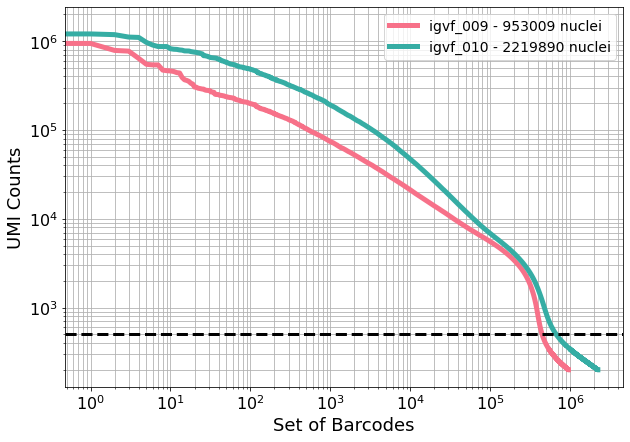

In [10]:
pf.plot_knee(adata, cutoff=500, category_column='plate', figsize=(10, 7))
plt.show()

In [7]:
# set var names to be gene names, not gene ID
adata.var_names  = adata.var['gene_name']
adata.var['mt'] = adata.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)


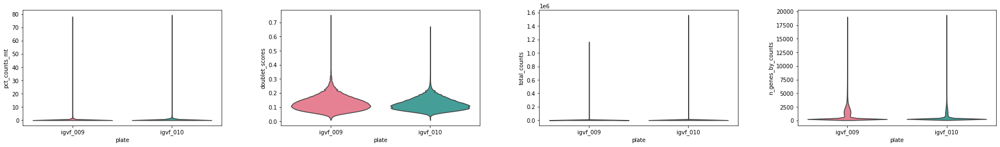

In [11]:
sc.pl.violin(adata, ['pct_counts_mt', 'doublet_scores', 'total_counts', 'n_genes_by_counts'],
             groupby = "plate", palette = plate_palette,
             jitter=0.4, multi_panel=True, size=0)

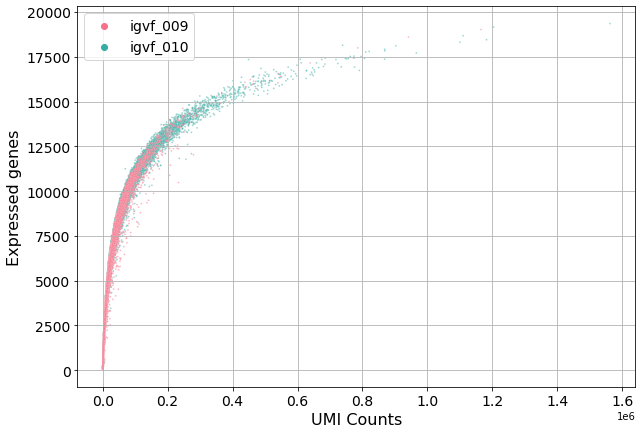

In [12]:
pf.plot_genes_by_counts(adata, category_column='plate', figsize=(10, 7))
plt.show()

In [13]:
adatas = adata[(adata.obs['total_counts'] < 10000) & (adata.obs['n_genes_by_counts'] < 2000), :]


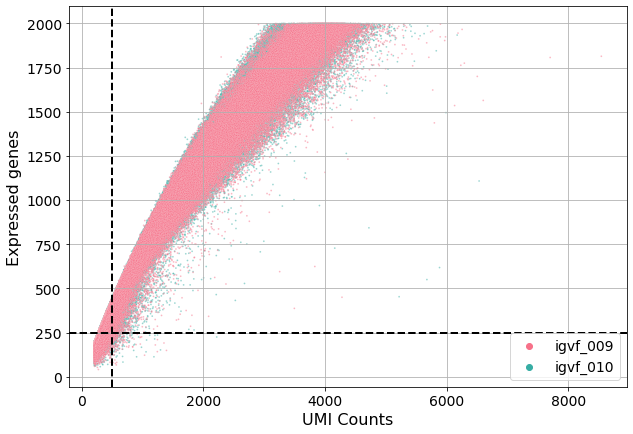

In [14]:
pf.plot_genes_by_counts(adatas, category_column='plate', figsize=(10, 7))

plt.axvline(x=500, color='k', linestyle='--', linewidth=2)
plt.axhline(y=250, color='k', linestyle='--', linewidth=2)

plt.show()

In [15]:
adatas[(adatas.obs['total_counts'] > 500) & (adatas.obs['n_genes_by_counts'] < 250), :]


View of AnnData object with n_obs × n_vars = 368 × 56953
    obs: 'bc', 'bc1_sequence', 'bc2_sequence', 'bc3_sequence', 'subpool', 'bc1_well', 'bc2_well', 'bc3_well', 'Mouse_Tissue_ID', 'alias_tissue1', 'alias_tissue2', 'alias_tissue3', 'alias_tissue4', 'plate', 'Protocol', 'Chemistry', 'well_type', 'Row', 'Column', 'Genotype', 'Notes', 'Multiplexed_sample1', 'Multiplexed_sample2', 'SampleType', 'Tissue', 'Tissue_ID', 'Tissue1_ontology_id', 'Tissue2_ontology_id', 'Sex', 'Replicate', 'DOB', 'Age_weeks', 'Age_days', 'Body_weight_g', 'Estrus_cycle', 'Dissection_date', 'Dissection_time', 'Dissector', 'Tissue_weight_mg', 'mult_genotype_1', 'mult_genotype_2', 'mult_genotype', 'n_counts', 'AJ', 'PWKJ', 'WSBJ', 'NZOJ', '129S1J', 'CASTJ', 'B6J', 'NODJ', 'doublet_scores', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_name', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    layers: 'raw_counts'

# QC plotting - filtered data
500 UMI, 250 genes, 1% mito, 0.25 doublet score


In [4]:
adata = sc.read("../IGVF_analysis/tissue_processed_500umi/Kidney_processed.h5ad")


In [5]:
adata = adata[adata.obs['Genotype'] != "tie",:]

print(adata.obs['Genotype'].value_counts())

NZOJ      155887
NODJ      148660
B6J       137319
AJ        130223
WSBJ      129973
129S1J    111021
PWKJ      107466
CASTJ     101688
Name: Genotype, dtype: int64


In [6]:
adata

View of AnnData object with n_obs × n_vars = 1022237 × 56953
    obs: 'bc', 'bc1_sequence', 'bc2_sequence', 'bc3_sequence', 'subpool', 'bc1_well', 'bc2_well', 'bc3_well', 'Mouse_Tissue_ID', 'alias_tissue1', 'alias_tissue2', 'alias_tissue3', 'alias_tissue4', 'plate', 'Protocol', 'Chemistry', 'well_type', 'Row', 'Column', 'Genotype', 'Notes', 'Multiplexed_sample1', 'Multiplexed_sample2', 'SampleType', 'Tissue', 'Tissue_ID', 'Tissue1_ontology_id', 'Tissue2_ontology_id', 'Sex', 'Replicate', 'DOB', 'Age_weeks', 'Age_days', 'Body_weight_g', 'Estrus_cycle', 'Dissection_date', 'Dissection_time', 'Dissector', 'Tissue_weight_mg', 'mult_genotype_1', 'mult_genotype_2', 'mult_genotype', 'n_counts', 'AJ', 'PWKJ', 'WSBJ', 'NZOJ', '129S1J', 'CASTJ', 'B6J', 'NODJ', 'doublet_scores', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'gene_name', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable

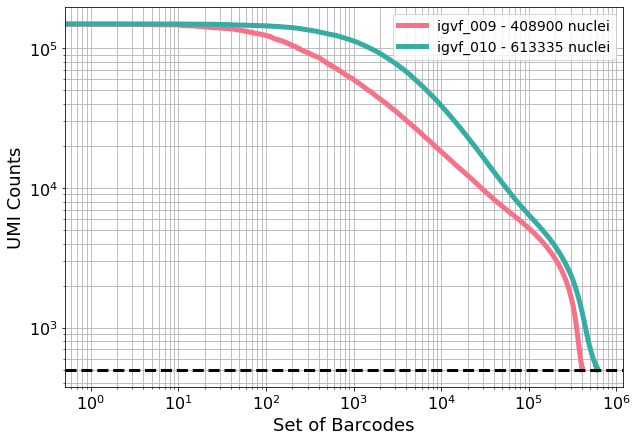

In [5]:
pf.plot_knee(adata, cutoff=500, category_column='plate', figsize=(10, 7))
plt.show()

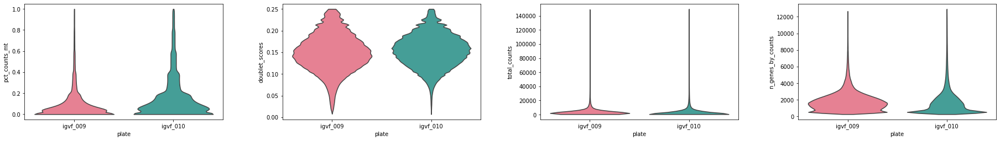

In [6]:
sc.pl.violin(adata, ['pct_counts_mt', 'doublet_scores', 'total_counts', 'n_genes_by_counts'],
             groupby = "plate", palette = plate_palette,
             jitter=0.4, multi_panel=True, size=0)

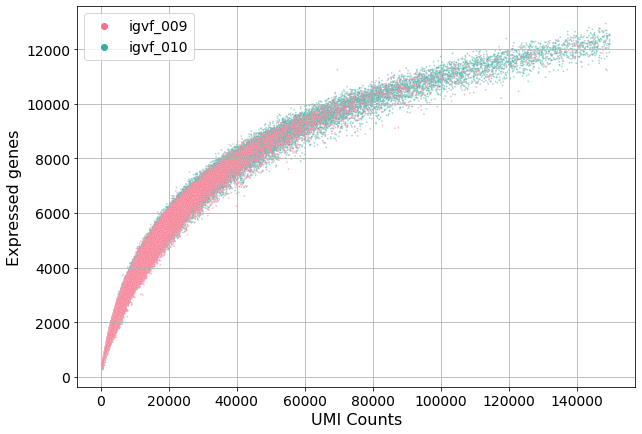

In [7]:
pf.plot_genes_by_counts(adata, category_column='plate', figsize=(10, 7))
plt.show()

# Check clustering
Plate, sex, genotype

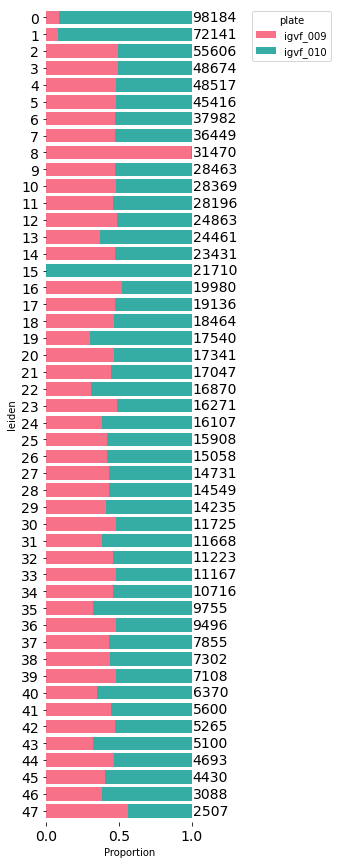

In [42]:
pf.stacked_barplot_proportions(adata.obs, 
                            'leiden', 'plate',
                            flip=True, fsize = (3,15), 
                            annotations = True)


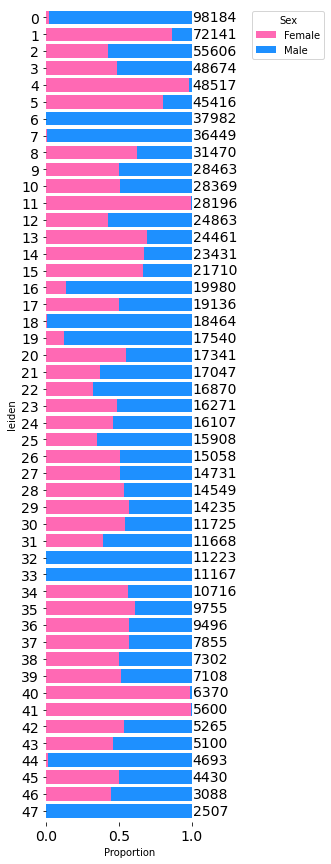

In [43]:
pf.stacked_barplot_proportions(adata.obs, 
                            'leiden', 'Sex',
                            flip=True, fsize = (3,15), 
                            annotations = True)


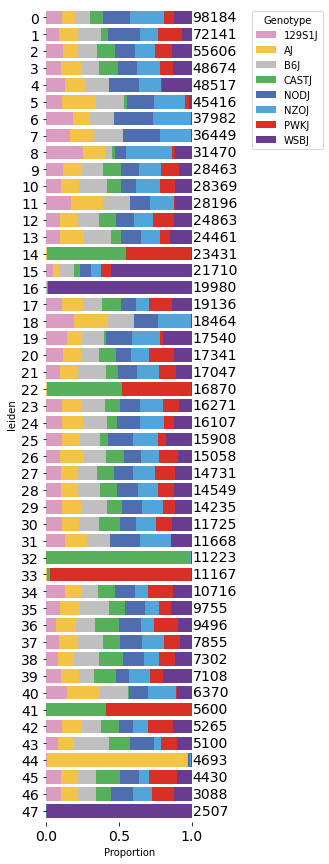

In [44]:
pf.stacked_barplot_proportions(adata.obs, 
                            'leiden', 'Genotype',
                            flip=True, fsize = (3,15), 
                            annotations = True)


/opt/apps/python/3.8.0/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/opt/apps/python/3.8.0/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


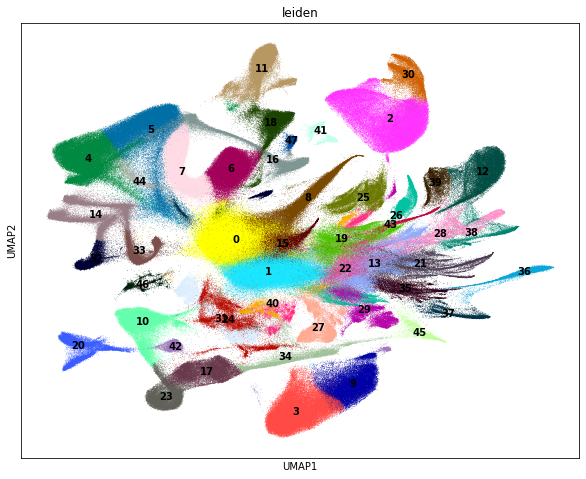

/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


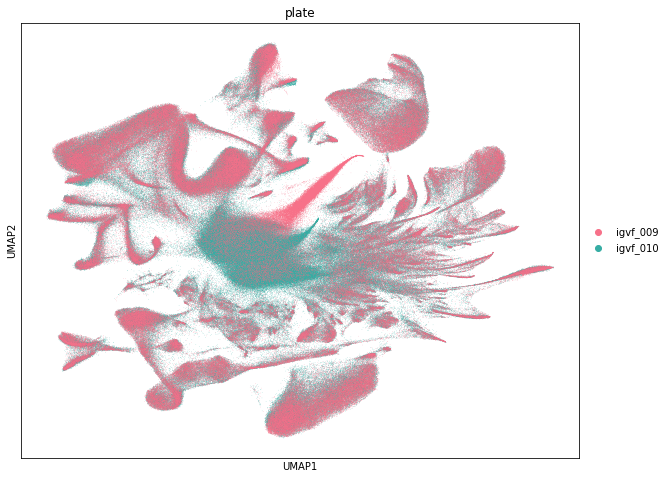

/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


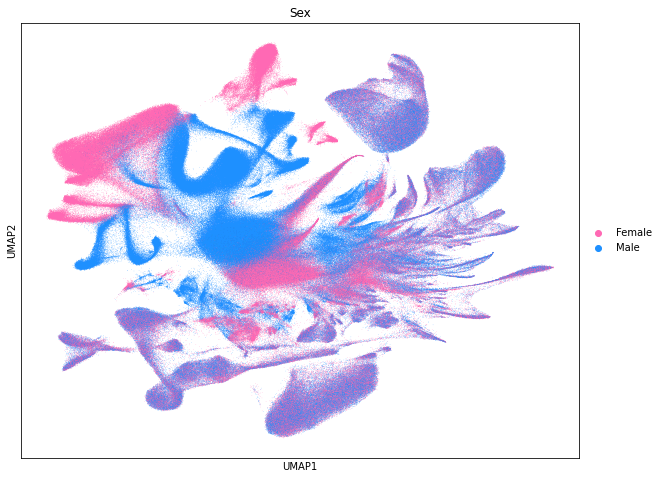

/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


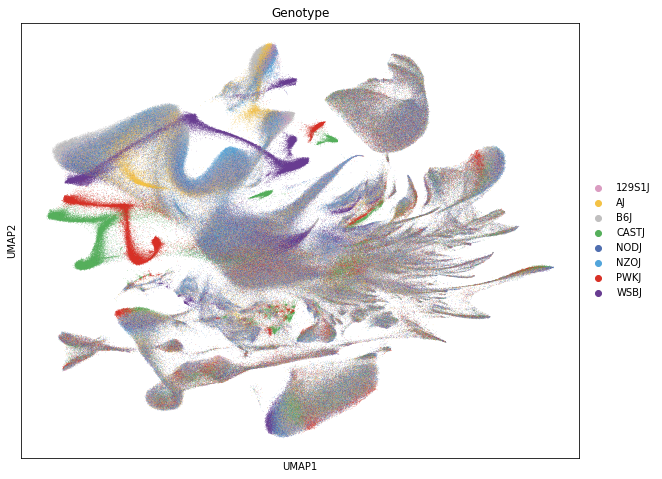

In [11]:
plt.rcParams['figure.figsize'] = (10, 8)

sc.pl.umap(adata, color=['leiden'], size=1, legend_loc = 'on data')

sc.pl.umap(adata, color=['plate'], size = 0.8, palette = plate_palette)

sc.pl.umap(adata, color=['Sex'], size = 0.8, palette = sex_palette)

sc.pl.umap(adata, color=['Genotype'], size = 0.8, palette = geno_palette)



# Remove large low-quality clusters and re-cluster

In [7]:
adata = adata[~adata.obs['leiden'].isin(["0","1","8","15"])]



In [24]:
adata = adata[adata.obs.doublet_scores < 0.2, :]


In [25]:
adata

View of AnnData object with n_obs × n_vars = 691866 × 56953
    obs: 'bc', 'bc1_sequence', 'bc2_sequence', 'bc3_sequence', 'subpool', 'bc1_well', 'bc2_well', 'bc3_well', 'Mouse_Tissue_ID', 'alias_tissue1', 'alias_tissue2', 'alias_tissue3', 'alias_tissue4', 'plate', 'Protocol', 'Chemistry', 'well_type', 'Row', 'Column', 'Genotype', 'Notes', 'Multiplexed_sample1', 'Multiplexed_sample2', 'SampleType', 'Tissue', 'Tissue_ID', 'Tissue1_ontology_id', 'Tissue2_ontology_id', 'Sex', 'Replicate', 'DOB', 'Age_weeks', 'Age_days', 'Body_weight_g', 'Estrus_cycle', 'Dissection_date', 'Dissection_time', 'Dissector', 'Tissue_weight_mg', 'mult_genotype_1', 'mult_genotype_2', 'mult_genotype', 'n_counts', 'AJ', 'PWKJ', 'WSBJ', 'NZOJ', '129S1J', 'CASTJ', 'B6J', 'NODJ', 'doublet_scores', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'gene_name', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable'

In [26]:
adata.uns['log1p']["base"] = None

In [27]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

adatas = adata[:, adata.var.highly_variable]



/Users/liz/opt/anaconda3/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:544: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['hvg'] = {'flavor': flavor}


In [28]:
sc.pp.regress_out(adatas, ['pct_counts_mt','n_genes_by_counts'])
sc.pp.scale(adatas, max_value=10)

sc.tl.pca(adatas, svd_solver='arpack', use_highly_variable = True)
sc.pp.neighbors(adatas, n_neighbors=20, n_pcs=30)

sc.tl.leiden(adatas, resolution = 1)

In [29]:
sc.tl.umap(adatas, min_dist = 0.5, spread =2.0)

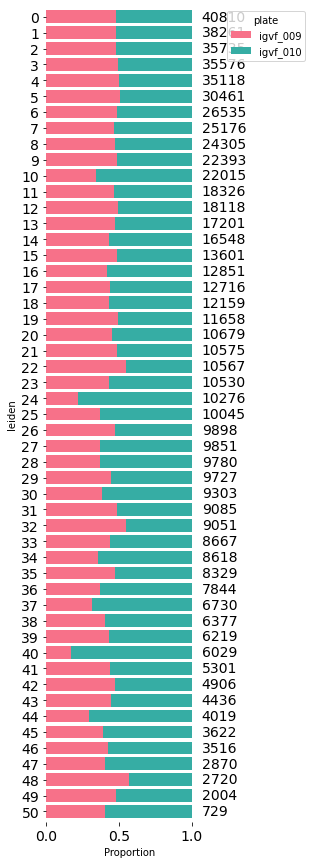

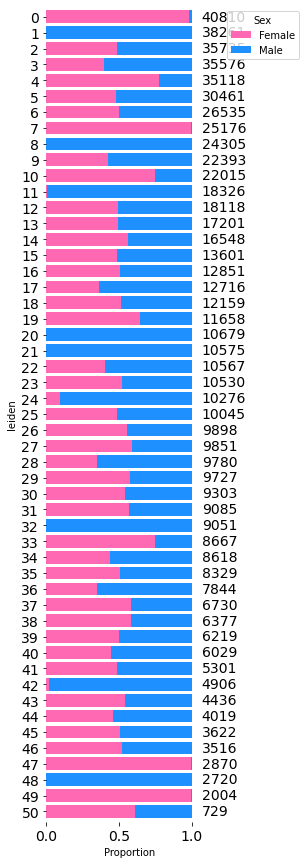

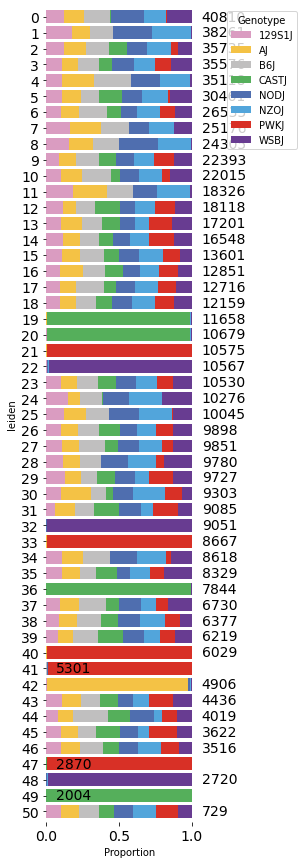

In [30]:
pf.stacked_barplot_proportions(adatas.obs, 
                            'leiden', 'plate',
                            flip=True, fsize = (3,15), 
                            annotations = True)

pf.stacked_barplot_proportions(adatas.obs, 
                            'leiden', 'Sex',
                            flip=True, fsize = (3,15), 
                            annotations = True)

pf.stacked_barplot_proportions(adatas.obs, 
                            'leiden', 'Genotype',
                            flip=True, fsize = (3,15), 
                            annotations = True)


/Users/liz/opt/anaconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


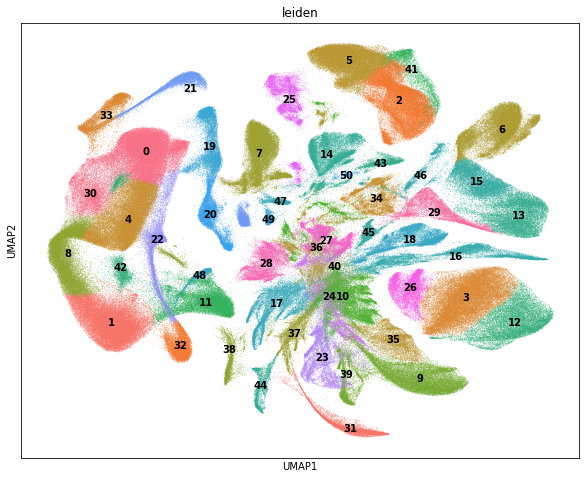

In [199]:
plt.rcParams['figure.figsize'] = (10, 8)

leiden_palette = sns.color_palette("husl", n_colors=51)

sc.pl.umap(adata, color=['leiden'], size=1, legend_loc = 'on data',palette=color_palette)




/Users/liz/opt/anaconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


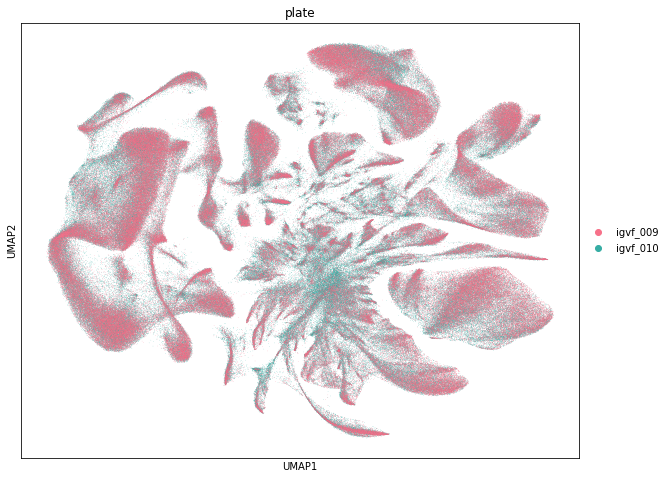

/Users/liz/opt/anaconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


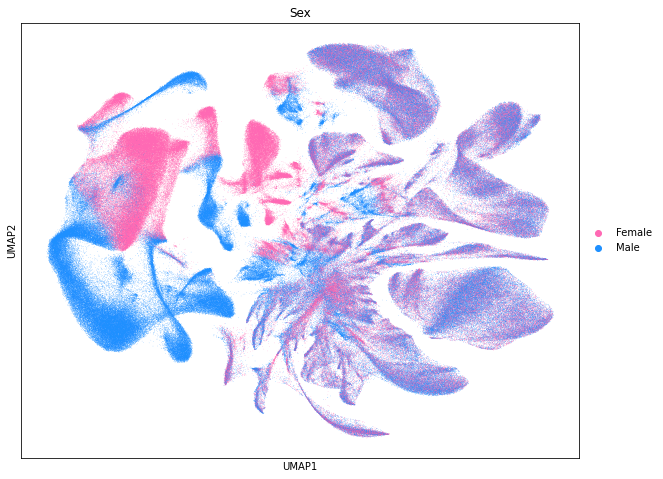

/Users/liz/opt/anaconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


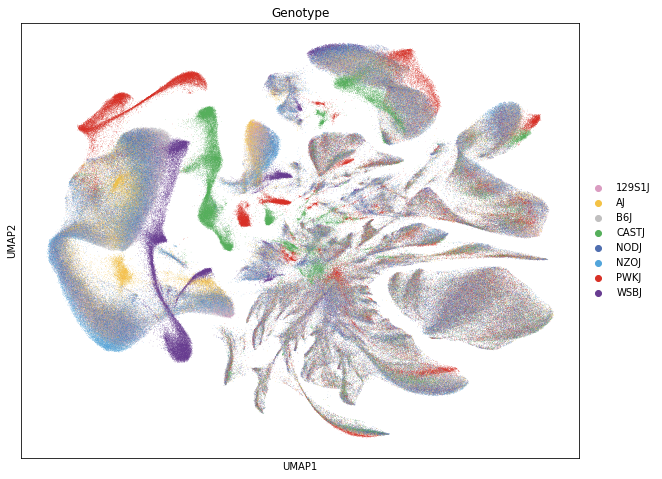

In [109]:
sc.pl.umap(adata, color=['plate'], size = 0.8, palette = plate_palette)

sc.pl.umap(adata, color=['Sex'], size = 0.8, palette = sex_palette)

sc.pl.umap(adata, color=['Genotype'], size = 0.8, palette = geno_palette)


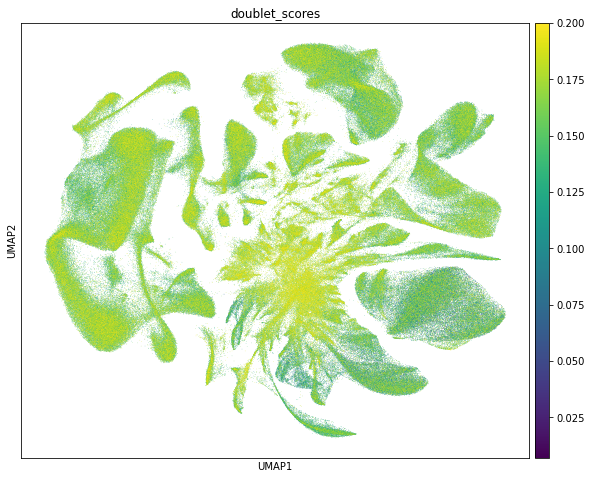

In [32]:
sc.pl.umap(adatas, color=['doublet_scores'], size=1)


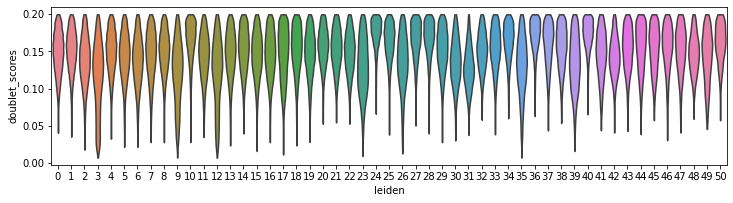

In [201]:
plt.rcParams['figure.figsize'] = (10, 3)

sc.pl.violin(adata, ['doublet_scores'],
             groupby = "leiden", palette = leiden_palette,
             jitter=0.4, multi_panel=True, size=0)

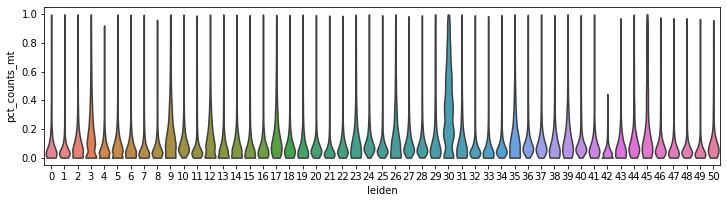

In [234]:
plt.rcParams['figure.figsize'] = (10, 3)

sc.pl.violin(adata, ['pct_counts_mt'],
             groupby = "leiden", palette = leiden_palette,
             jitter=0.4, multi_panel=True, size=0)

In [35]:
adata.uns['neighbors'] = adatas.uns['neighbors']
adata.uns['leiden'] = adatas.uns['leiden']
adata.uns['umap'] = adatas.uns['umap']
adata.obs['leiden'] = adatas.obs['leiden']
adata.obsm = adatas.obsm
adata.obsp = adatas.obsp

In [36]:
adata.write_h5ad('../IGVF_analysis/annotated_tissues/Kidney_filtered.h5ad')


# Label transfer
https://github.com/mousepixels/sanbomics_scripts/blob/main/scvi_label_transfer.ipynb

Dataset: https://cellxgene.cziscience.com/collections/92fde064-2fb4-41f8-b85c-c6904000b859. Healthy mouse kidney atlas. 6 tissues, 141,401 cells. 

- cortex of kidney
- inner medulla of kidney
- kidney
- outer medulla of kidney
- renal glomerulus
- renal medulla


On HPC, hpc3sc conda environment.

In [5]:
adata = sc.read('../IGVF_analysis/annotated_tissues/Kidney_filtered.h5ad')

In [70]:
adata.var['gene_ids'] = adata.var.index
adata.var['gene_ids'] = adata.var['gene_ids'].str.split('.').str[0]


In [71]:
adata.var.set_index('gene_ids', inplace=True)


In [2]:
ref_data = sc.read_h5ad('../IGVF_analysis/external_ref/cellxgene_mouse_kidney.h5ad')


/Users/liz/opt/anaconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


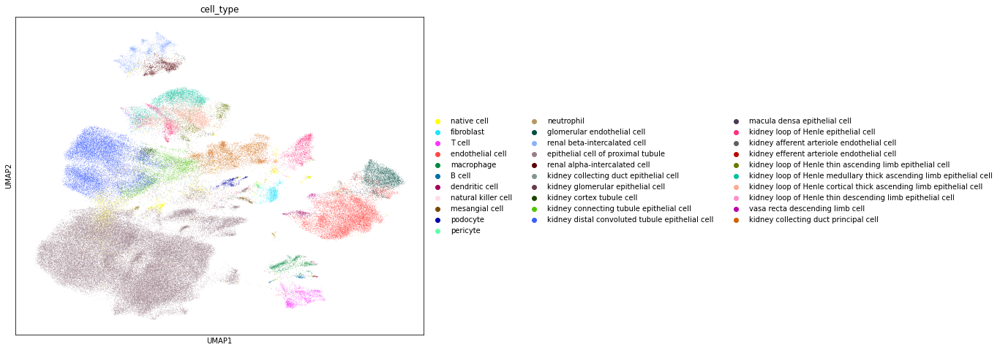

In [151]:
sc.pl.umap(ref_data, color=['cell_type'], size=1)


/Users/liz/opt/anaconda3/lib/python3.8/site-packages/pandas/core/internals/blocks.py:351: RuntimeWarning: divide by zero encountered in log10
  result = func(self.values, **kwargs)


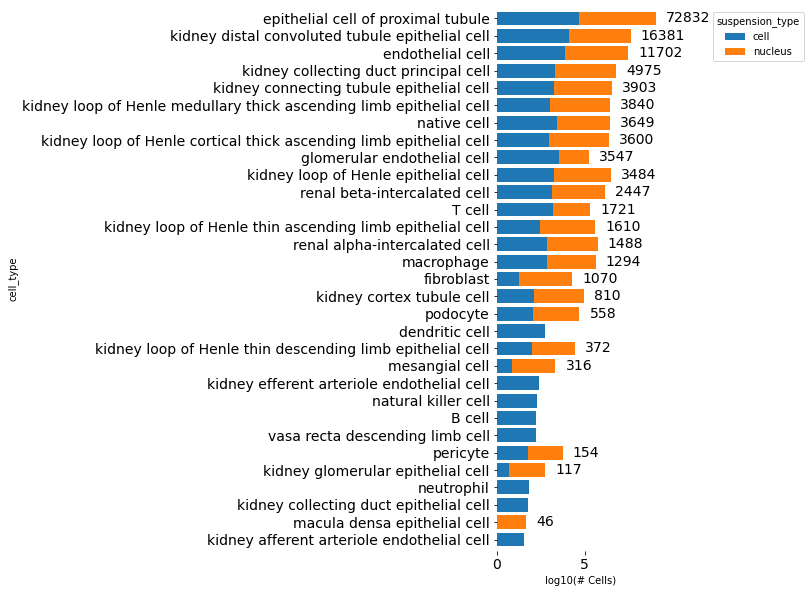

In [20]:
m = ref_data.obs.groupby(['cell_type']).size().to_frame()
sorted_celltypes = m[0].sort_values().index

# Group the data by 'cluster_key' and 'var_key' and count occurrences
grouped_data = ref_data.obs.groupby(['cell_type', 'suspension_type']).size().unstack().fillna(0)

grouped_data = grouped_data.sort_values(by='cell_type', ascending=False)
m = m.loc[sorted_celltypes]
grouped_data = grouped_data.loc[sorted_celltypes]
    
grouped_data_log10 = np.log10(grouped_data)


ax = grouped_data_log10.plot(kind='barh', stacked=True, figsize=(3,10), width=0.8)
l = len(ref_data.obs['suspension_type'].dropna().unique()) - 1
ax.bar_label(ax.containers[l], labels=m[0], label_type='edge', padding=10, fontsize=14)

ax.tick_params(axis="x", labelsize=14)
ax.tick_params(axis="y", labelsize=14)
ax.set_xlabel("log10(# Cells)")
ax.set_ylabel('cell_type')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

ax.legend(title='suspension_type', bbox_to_anchor=(1.26, 1), loc='upper left')
ax.grid(False)


plt.show()

## Merge and preprocess again

In [84]:
adata = adata.concatenate(ref_data)


/Users/liz/opt/anaconda3/lib/python3.8/site-packages/anndata/_core/merge.py:1111: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


In [85]:
adata.layers["raw_counts"] = adata.X.copy()
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.raw = adata


In [86]:
# hmmmm using seurat_v3...
sc.pp.highly_variable_genes(adata, flavor = 'seurat_v3', n_top_genes=2000,
                            layer = "raw_counts", batch_key="batch", subset = True)



/Users/liz/opt/anaconda3/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:61: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(


# Run scvi

In [ ]:
scvi.model.SCVI.setup_anndata(adata, layer = 'raw_counts', batch_key='batch')
vae = scvi.model.SCVI(adata)
vae.train()


In [ ]:
adata.obs['cell_type'] = adata.obs['cell_type'].cat.add_categories('Unknown')
adata.obs = adata.obs.fillna(value = {'cell_type': 'Unknown'})



In [ ]:
lvae = scvi.model.SCANVI.from_scvi_model(vae, adata = adata, unlabeled_category = 'Unknown',
                                        labels_key = 'cell_type')

lvae.train(max_epochs=20, n_samples_per_label=100)

adata.obs['predictions'] = lvae.predict(adata)

In [ ]:
adata.obs['cell_barcodes'] = adata.obs.index.map(lambda x: x[:-2])

cell_mapper = dict(zip(adata.obs.cell_barcodes, adata.obs.predictions))

In [ ]:
cell_mapper.head()

In [ ]:
cell_mapper.to_csv("cell_mapper.csv")

## Map back onto original adata

In [ ]:
adata = sc.read('../IGVF_analysis/annotated_tissues/Kidney_filtered.h5ad')


In [ ]:
adata.obs['predictions'] = adata.obs.index.map(cell_mapper)


In [ ]:
adata.write_h5ad('../IGVF_analysis/annotated_tissues/Kidney_filtered.h5ad')


In [2]:
adata = sc.read('../IGVF_analysis/annotated_tissues/Kidney_filtered.h5ad')


In [8]:
plt.rcParams['figure.figsize'] = (10, 8)


/Users/liz/opt/anaconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


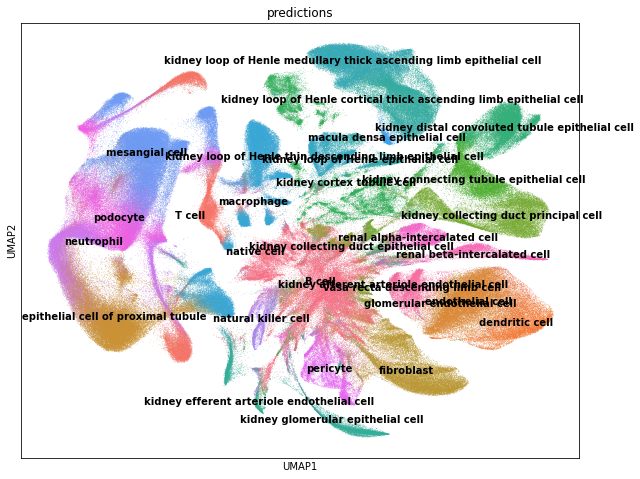

In [181]:
color_palette = sns.color_palette("husl", n_colors=30)

sc.pl.umap(adata, color=['predictions'], size=1, legend_loc = 'on data',palette=color_palette)



/Users/liz/opt/anaconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


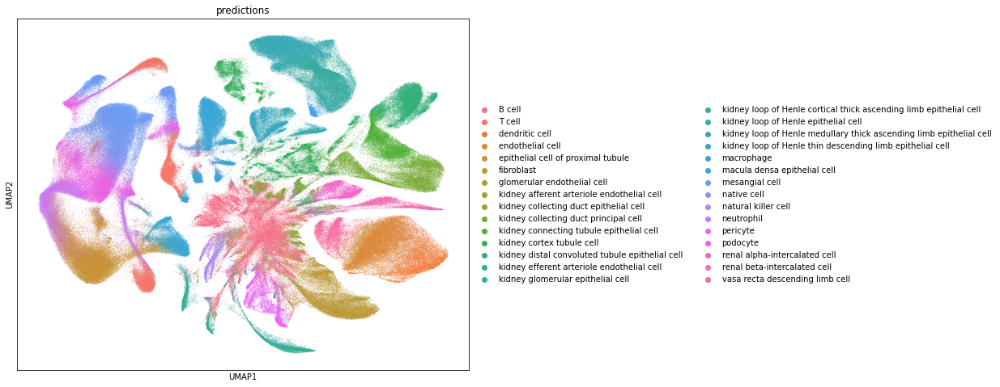

In [182]:
sc.pl.umap(adata, color=['predictions'], size=1, palette=color_palette)


In [14]:
obs = adata.obs

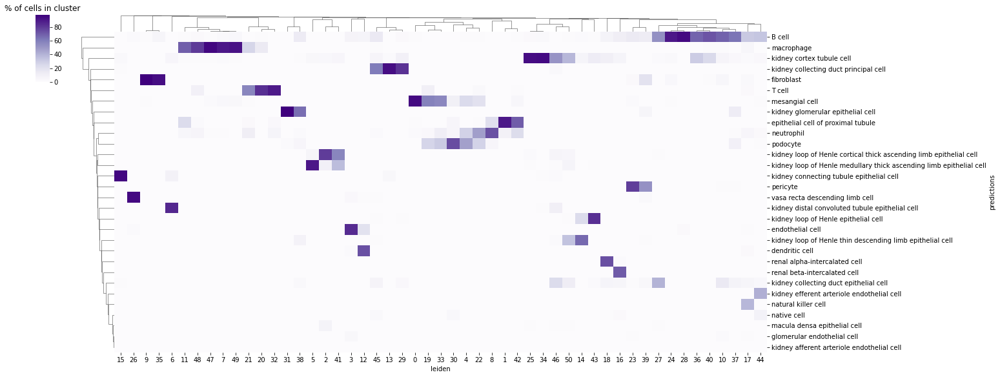

In [54]:
confusion_matrix_df = pd.crosstab(obs['leiden'], obs['predictions'])
confusion_matrix_df_percentage = confusion_matrix_df.div(confusion_matrix_df.sum(axis=1), axis=0) * 100
confusion_matrix_df_percentage_transposed = confusion_matrix_df_percentage.transpose()

sns.clustermap(confusion_matrix_df_percentage_transposed, 
               cmap='Purples',
               dendrogram_ratio=0.05,
               cbar_pos=(-0.04, 0.8, 0.015, 0.18),
               cbar=True,
               method='average', 
               metric='euclidean', 
               figsize=(20, 8), 
               col_cluster=True, 
               row_cluster=True)
plt.title('% of cells in cluster')
plt.show()

# Over-representation analysis of marker genes from Lake 2023

In [132]:
import decoupler as dc

In [55]:
adata.var_names  = adata.var['gene_name']


In [104]:
# Lake et al 2023 https://www.nature.com/articles/s41586-023-05769-3#Sec66
marker_genes_dict = {
    "Podocyte": ["Ptprq", "Wt1", "Ntng1", "Nphs1", "Nphs2", "Clic5", "Podxl"],
    "Parietal Epithelial Cell": ["Cldn1", "Vcam1", "Cfh", "Rbfox1", "Aldh1a2"],
    "Proximal Tubule Cell": ["Lrp2", "Cubn", "Slc13a1"],
    "Proximal Tubule Epithelial Cell Segment 1": ["Slc5a12", "Slc13a3", "Slc22a6", "Prodh2", "Slc5a2", "Slc22a8"],
    "Proximal Tubule Epithelial Cell Segment 2": ["Slc5a12", "Slc13a3", "Slc22a6", "Slc34a1", "Slc22a7"],
    "Proximal Tubule Epithelial Cell Segment 3": ["Slc22a7", "Mogat1", "Slc5a11", "Slc7a13", "Slc5a8", "Abcc3", "Satb2"],
    "Thin Limb Cell": ["Cryab", "Tacstd2", "Slc44a5", "Klrg2", "Col26a1", "Boc"],
    "Descending Thin Limb Cell Type 2": ["Vcam1", "Slc39a8", "Aqp1", "Lrrc4c", "Lrp2", "Unc5d", "Satb2"],
    "Descending Thin Limb Cell Type 1": ["Satb2", "Jag1", "Adgrl3", "Id1"],
    "Descending Thin Limb Cell Type 3": ["Cldn1", "Cldn4", "Bcl6", "Sh3gl3", "Slc14a2", "Smoc2"],
    "Ascending Thin Limb Cell": ["Cldn1", "Cldn4", "Bcl6", "Sh3gl3", "Bcas1", "Clcnka", "Cldn10", "Prox1"],
    "Thick Ascending Limb Cell": ["Casr", "Slc12a1", "Umod"],
    "Medullary Thick Ascending Limb Cell": ["Nell1", "Esrrb", "Egf", "Cldn14", "Prox1", "Mfsd4a", "Kctd16", "Rap1gap", "Ank2", "Cyfip2"],
    "Cortical Thick Ascending Limb Cell": ["Nell1", "Esrrb", "Egf", "Ppm1e", "Gp2", "Enox1", "Tmem207", "Tmem52b", "Cldn16", "Wnk1"],
    "Macula Densa Cell": ["Nos1", "Robo2", "Calcr", "Ppfia2", "Pappa2"],
    "Distal Convoluted Tubule Cell": ["Slc12a3", "Cnnm2", "Fgf13", "Klhl3", "Lhx1", "Trpm6"],
    "Distal Convoluted Tubule Cell Type 1": ["Trpm7", "Adamts17", "Itpkb", "Hs6st2"],
    "Distal Convoluted Tubule Cell Type 2": ["Trpv5", "Slc8a1", "Scn2a", "Hsd11b2", "Calb1"],
    "Connecting Tubule": ["Slc8a1", "Scn2a", "Hsd11b2", "Calb1"],
    "Connecting Tubule Cell": ["Kitl", "Pcdh7"],
    "Connecting Tubule Principal Cell": ["Ralyl", "Tox", "Sgpp1", "Scnn1g", "Scnn1b", "Kcnip1"],
    "Principal Cell": ["Gata3", "Aqp2", "Aqp3"],
    "Cortical Collecting Duct Principal Cell": ["Scnn1g", "Scnn1b", "Fxyd4", "Sox5", "Pde10a", "Slc25a29", "St6gal1", "Pappa"],
    "Outer Medullary Collecting Duct Principal Cell": ["Scnn1g", "Scnn1b", "Fxyd4", "Sox5", "Syk", "Fam81a", "Prom1", "Kcnk13"],
    "Inner Medullary Collecting Duct Cell": ["Fxyd4", "Sox5", "Phactr1", "Pcdh7", "Slc14a2", "Hs3st5"],
    "Papillary Epithelial Cells": ["Tacstd2", "Gpx2", "Fxyd3", "Krt5"],
    "Intercalated Cell": ["Atp6v0d2", "Atp6v1c2", "Tmem213", "Clnk"],
    "Cortical Collecting Duct Intercalated Cell Type A": ["Slc4a1", "Slc26a7", "Hs6st3", "Nxph2", "Lef1", "Adgrf5"],
    "Connecting Tubule Intercalated Cell Type A": ["Slc4a1", "Slc26a7", "Slc8a1", "Scn2a", "Calb1"],
    "Outer Medullary Collecting Duct Intercalated Cell Type A": ["Slc4a1", "Slc26a7", "Kit", "Aqp6", "Stap1", "Fam184b", "Calca"],
    "Intercalated Beta Cell": ["Slc4a9", "Slc35f3", "Slc26a4", "Insrr", "Tldc2"],
    "Endothelial Cell": ["Cd34", "Pecam1", "Ptprb", "Meis2", "Flt1", "Emcn"],
    "Glomerular Capillary Endothelial Cell": ["Emcn", "Hecw2", "Plat", "Itga8", "Ehd3", "Kdr", "Sost"],
    "Afferent / Efferent Arteriole Endothelial Cell": ["Btnl9", "Adamts6", "Palmd", "Aqp1", "Tm4sf1", "Vegfc", "Ccdc3", "Cdh5", "Serpine2", "Fbln5", "Cxcl12", "Sox17"],
    "Descending Vasa Recta Endothelial Cell": ["Btnl9", "Adamts6", "Palmd", "Aqp1", "Tm4sf1", "Mctp1", "Slc14a1", "Enpp2", "Lypd6b"],
    "Peritubular Capillary Endothelial Cell": ["Ceacam1", "Dnase1l3", "Plvap", "Pitpnc1", "Grb10", "Slco2a1", "Rapgef4"],
    "Ascending Vasa Recta Endothelial Cell": ["Ceacam1", "Dnase1l3", "Plvap", "Gpm6a", "Edil3", "Tll1",  "Nr2f2"],
    "Lymphatic Cell": ["Mmrn1", "Cd36", "Tbx1", "Pkhd1l1", "Prox1"],
    "Vascular Smooth Muscle Cell / Pericyte": ["Notch3", "Pdgfrb", "Itga8"],
    "Mesangial Cell": ["Pip5k1b", "Robo1", "Piezo2", "Daam2", "Phtf2", "Gata3", "Postn"],
    "Renin-positive Juxtaglomerular Granular Cell": ["Pip5k1b", "Robo1", "Ren1", "Pde10a", "Abcc8", "Col13a1", "Grid2"],
    "Vascular Smooth Muscle Cell": ["Ntrk3", "Myh11", "Rgs6", "Adra1a", "Ldb3", "Mcam"],
    "Vascular Smooth Muscle Cell / Pericyte": ["Ntrk3", "Rgs5", "Abcc9", "Adcy3", "Adgrb3"],
    "Fibroblast1": ["Col1a1", "Col1a2", "C7", "Negr1", "Fbln5", "Dcn", "Cdh11"],
    "Fibroblast2": ["Lama2", "Ggt5", "Lum", "Aebp1", "C1s1", "Sfrp1", "Meg3", "Cxcl12"],
    "Medullary Fibroblast1": ["Syt1", "Tnc", "Plcxd3", "Gabrg3", "Greb1l", "Kcnk2"],
    "Medullary Fibroblast2": ["Syt1", "Tnc", "Adamtsl1", "Clmp", "Ncam1", "Frem1"],
    "Medullary Fibroblast3": ["Syt1", "Tnc", "Igfbp5", "Mgp", "Bgn", "Igfbp2"],
    "Myofibroblast1": ["Synpo2", "Pcdh7", "Kcnma1", "Lmod1", "Ttll7", "Dtna", "Col14a1"],
    "Myofibroblast2": ["Lama2", "Col16a1", "Sulf1", "Col6a3", "Ntm", "Gli2", "Col5a1", "Fn1"],
    "Myofibroblast3": ["Col16a1", "Sulf1", "Slc24a3", "Cdh13", "Smoc2", "Ano3", "Rxfp1"],
    "Immune Cells": ["Ptprc"],
    "B Cell": ["Bank1", "Blk", "Ms4a1", "Bach2"],
    "Plasma Cell": ["Igkc", "Tent5c", "Mzb1", "Fcrl5", "Cd38", "Jchain"],
    "T Cell": ["Cd96", "Cd247", "Themis", "Bcl11b", "Camk4", "Il7r"],
    "Natural Killer T Cell": ["Cd96", "Cd247", "Runx3","Nkg7", "Ccl5", "Ccl4", "Gzma"],
    "Mast Cell": ["Ms4a2", "Cpa3", "Kit"],
    "M2 Macrophage": ["F13a1", "Mrc1", "Cd163", "Stab1", "Slc1a3", "Cd14", "Folr2"],
    "Monocyte-derived Cell": ["Msr1", "Itgax", "Csf2ra", "Cd14", "Trpm2"],
    "Classical Dendritic Cell": ["Itgax","Csf2ra", "Ciita", "Wdfy4", "Flt3", "Zfp366", "Cadm1", "Zbtb46", "Clec9a"],
    "Plasmacytoid Dendritic Cell": ["Irf8", "Cux2", "P2ry14", "Il3ra"],
    "Non-Classical Monocyte": ["Ctss", "Irak3", "Tcf7l2", "Tnfrsf1b", "Fcna","Fcnb"],
    "Neutrophil": ["S100a9", "S100a8", "Ifitm2"],
    "Schwann Cell / Neural": ["Cdh19", "Nrxn1", "Gins3"],
}




In [130]:
flat_data = [(cell_type, gene) for cell_type, genes in marker_genes_dict.items() for gene in genes]
marker_genes_df = pd.DataFrame(flat_data, columns=['celltype', 'gene_name'])



In [141]:
adata.raw = adata


In [142]:
dc.run_ora(
    mat=adata,
    net=marker_genes_df,
    source='celltype',
    target='gene_name',
    min_n=3,
    verbose=True
)

7943 features of mat are empty, they will be removed.
Running ora on mat with 691866 samples and 49010 targets for 61 sources.


100%|██████████| 691866/691866 [35:05<00:00, 328.56it/s]


In [235]:
acts = dc.get_acts(adata, obsm_key='ora_estimate')

# We need to remove inf and set them to the maximum value observed for pvals=0
acts_v = acts.X.ravel()
max_e = np.nanmax(acts_v[np.isfinite(acts_v)])
acts.X[~np.isfinite(acts.X)] = max_e

acts


AnnData object with n_obs × n_vars = 691866 × 44
    obs: 'bc', 'bc1_sequence', 'bc2_sequence', 'bc3_sequence', 'subpool', 'bc1_well', 'bc2_well', 'bc3_well', 'Mouse_Tissue_ID', 'alias_tissue1', 'alias_tissue2', 'alias_tissue3', 'alias_tissue4', 'plate', 'Protocol', 'Chemistry', 'well_type', 'Row', 'Column', 'Genotype', 'Notes', 'Multiplexed_sample1', 'Multiplexed_sample2', 'SampleType', 'Tissue', 'Tissue_ID', 'Tissue1_ontology_id', 'Tissue2_ontology_id', 'Sex', 'Replicate', 'DOB', 'Age_weeks', 'Age_days', 'Body_weight_g', 'Estrus_cycle', 'Dissection_date', 'Dissection_time', 'Dissector', 'Tissue_weight_mg', 'mult_genotype_1', 'mult_genotype_2', 'mult_genotype', 'n_counts', 'AJ', 'PWKJ', 'WSBJ', 'NZOJ', '129S1J', 'CASTJ', 'B6J', 'NODJ', 'doublet_scores', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'predictions'
    uns: 'Genotype_colors', 'Sex_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'plate_colors', 'uma

# Over-representation analysis of my marker genes
Most if not all came from here: https://www.ncbi.nlm.nih.gov/pmc/articles/PMC9233501/

Live markers link: https://docs.google.com/spreadsheets/d/1RJHnxeobFfXAQdrUGAn4SWxQZzs0KaheuLJgNc6AjCg/edit#gid=0

In [232]:
my_markers_df = pd.read_csv("IGVF_curated_markers.csv")
my_markers_df = my_markers_df[my_markers_df['Gene'].isin(adata.var_names)]
my_markers_df = my_markers_df[my_markers_df['Tissue'] == 'Kidney']
my_markers_df['gene_name'] = my_markers_df['Gene']
my_markers_df = my_markers_df.drop_duplicates(subset=['Subtype', 'gene_name'])


In [233]:
dc.run_ora(
    mat=adata,
    net=my_markers_df,
    source='Subtype',
    target='gene_name',
    min_n=3,
    verbose=True
)


7943 features of mat are empty, they will be removed.
Running ora on mat with 691866 samples and 49010 targets for 44 sources.


100%|██████████| 691866/691866 [32:53<00:00, 350.50it/s]


In [236]:
acts2 = dc.get_acts(adata, obsm_key='ora_estimate')

# We need to remove inf and set them to the maximum value observed for pvals=0
acts2_v = acts2.X.ravel()
max_e = np.nanmax(acts2_v[np.isfinite(acts2_v)])
acts2.X[~np.isfinite(acts2.X)] = max_e

acts2


AnnData object with n_obs × n_vars = 691866 × 44
    obs: 'bc', 'bc1_sequence', 'bc2_sequence', 'bc3_sequence', 'subpool', 'bc1_well', 'bc2_well', 'bc3_well', 'Mouse_Tissue_ID', 'alias_tissue1', 'alias_tissue2', 'alias_tissue3', 'alias_tissue4', 'plate', 'Protocol', 'Chemistry', 'well_type', 'Row', 'Column', 'Genotype', 'Notes', 'Multiplexed_sample1', 'Multiplexed_sample2', 'SampleType', 'Tissue', 'Tissue_ID', 'Tissue1_ontology_id', 'Tissue2_ontology_id', 'Sex', 'Replicate', 'DOB', 'Age_weeks', 'Age_days', 'Body_weight_g', 'Estrus_cycle', 'Dissection_date', 'Dissection_time', 'Dissector', 'Tissue_weight_mg', 'mult_genotype_1', 'mult_genotype_2', 'mult_genotype', 'n_counts', 'AJ', 'PWKJ', 'WSBJ', 'NZOJ', '129S1J', 'CASTJ', 'B6J', 'NODJ', 'doublet_scores', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'predictions'
    uns: 'Genotype_colors', 'Sex_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'plate_colors', 'uma

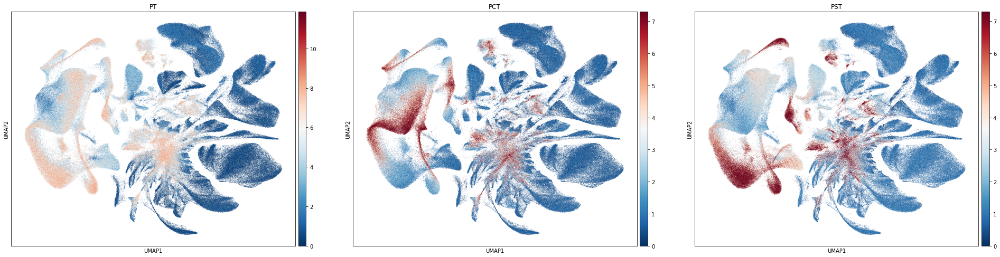

In [281]:
plt.rcParams['figure.figsize'] = (10, 8)

sc.pl.umap(acts2, color=['PT','PCT','PST'], size=1, cmap='RdBu_r')



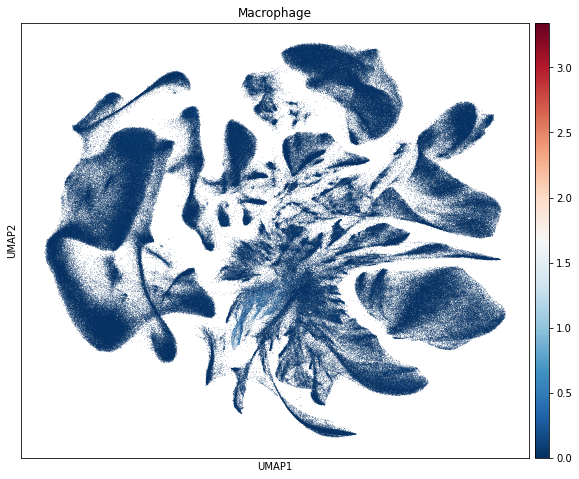

In [274]:
sc.pl.umap(acts2, color=['Macrophage'], size=1, cmap='RdBu_r')


# Find cluster level markers


/Users/liz/opt/anaconda3/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/Users/liz/opt/anaconda3/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:398: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/Users/liz/opt/anaconda3/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:401: PerformanceWarning: DataFrame is highly 

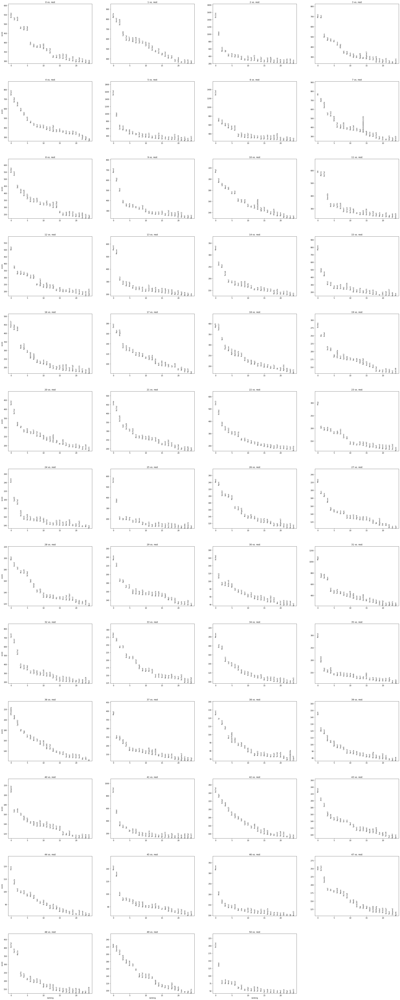

In [219]:
sc.tl.rank_genes_groups(adata, 'leiden', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)


In [554]:
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
result = pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']})


In [571]:
result.to_csv("kidney_cluster_markers.csv")

# Dot plot of selected markers

In [12]:
genes_dict = {
    "Podocyte": ["Wt1","Nphs1", "Nphs2"],
    "Proximal tubule": ["Lrp2","Cubn","Slc13a1"],
    "Proximal convoluted tubule": ["Slc5a12","Slc5a2",
                                   "Slc6a19"],
    "Proximal straight tubule": ["Akr1c21","Kap",
                                 "Slc16a9","Slc7a13"],
    "Damage associated proximal tubule": ["Cp",'Akap12','Dcdc2a'],
    "Thin limb": ["Fst","Aqp1","Bst1","Epha7", "Tacstd2", "Klrg2", "Col26a1", "Boc"],
    "Thick ascending limb": ["Umod","Esrrb","Casr"],
    "Medullary thick ascending limb": ["Prox1", "Mfsd4a","Rap1gap"],
    "Cortical thick ascending limb": ["Gp2", "Enox1", "Tmem207", "Cldn16"],
    "Distal convoluted tubule": ["Slc12a3", "Cnnm2", "Fgf13", "Lhx1", "Trpm6"],
    "Connecting tubule": ["Hsd11b2", "Calb1","Kitl", "Scnn1g", "Scnn1b"],
    "Principal cell": ["Gata3", "Aqp2", "Aqp3"],
    "Collecting duct": ["Scnn1g", "Scnn1b", "Fxyd4", "St6gal1", "Pappa"],
    "Inner medullary collecting duct": ["Pcdh7", "Slc14a2"],  
    "Intercalated cell": ["Atp6v0d2", "Atp6v1c2", "Clnk"],
    "Intercalated cell type A": ["Slc4a1", "Kit", "Aqp6"],
    "Intercalated cell type B": ["Slc4a9", "Slc26a4", "Insrr"],
    "Endothelial": ['Cd34', 'Pecam1', 'Ptprb', 'Flt1'],
    "Fibroblast": ["C7","Fbln5",  "Cdh11","Frem1","Dcn"],
    "Myofibroblast": ["Synpo2", "Lmod1","Col16a1","Gli2","Sulf1","Smoc2"],
    "VSMC / Pericyte": ["Notch3", "Pdgfrb", "Itga8"],
    "Mesangial": ["Robo1", "Piezo2", "Daam2"],
    "Juxtaglomerular" : ["Ren1","Col13a1"],
    "Smooth muscle": ["Myh11", "Mcam","Rgs5"],
    "Immune": ["Ptprc","Cd74","Themis","Ikzf1","Bcl11a"],
    "Adipocyte": ["Adipoq", "Pnpla2"], 
}


categories: 0, 1, 2, etc.
var_group_labels: Podocyte, Proximal tubule, Proximal convoluted tubule, etc.


/Users/liz/opt/anaconda3/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


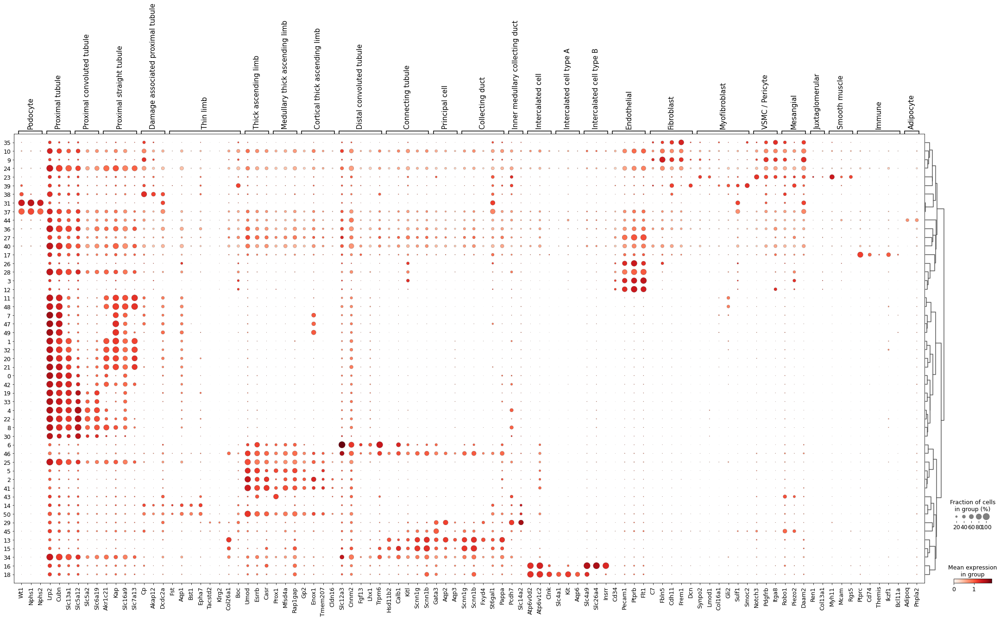

In [25]:
plt.rcParams.update({'font.size': 15})

sc.pl.dotplot(adata, genes_dict, 'leiden', mean_only_expressed = True,
              dendrogram=True, log=True)




# Assign celltypes to clusters

In [7]:
annots = pd.read_csv("Kidney_annotations.csv")
annots['leiden'] = annots['leiden'].astype(str)
annotation_dict = annots.groupby('leiden').head(1).set_index('leiden')['celltype'].to_dict()


In [8]:
adata.obs['celltype'] = adata.obs['leiden'].map(annotation_dict)

/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


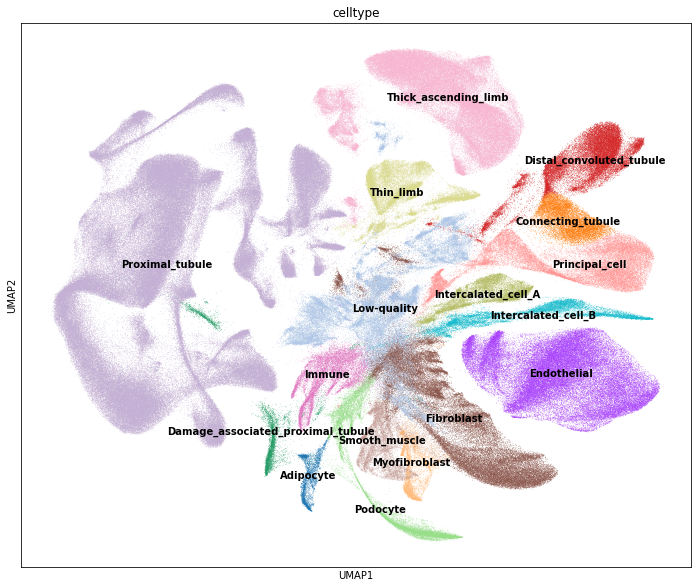

In [13]:
plt.rcParams['figure.figsize'] = (12, 10)

sc.pl.umap(adata, color=['celltype'], size=1, legend_loc = 'on data')


In [14]:
sc.tl.dendrogram(adata, groupby = 'celltype')

categories: Adipocyte, Connecting_tubule, Damage_associated_proximal_tubule, etc.
var_group_labels: Podocyte, Proximal tubule, Proximal convoluted tubule, etc.


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


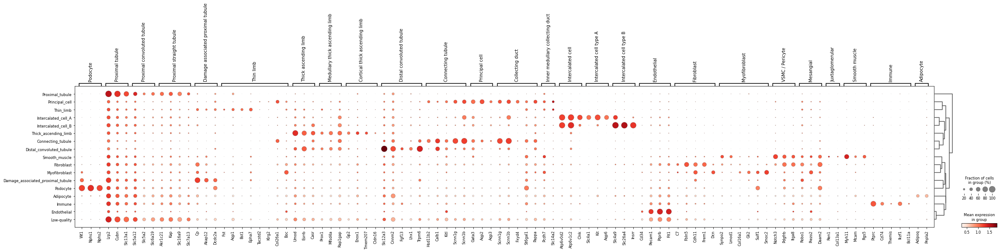

In [15]:
sc.pl.dotplot(adata, genes_dict, 'celltype', mean_only_expressed = True,
              dendrogram=True, log=True)


# Save annotated adata

In [16]:
adata.write_h5ad('../IGVF_analysis/annotated_tissues/Kidney_annotated.h5ad')


# Additional plots

In [6]:
adata = sc.read('../IGVF_analysis/annotated_tissues/Kidney_annotated.h5ad')


In [26]:
nonnephron_clusters = ['17','26','3','12','44','23','39','35','9','10']
doublet = ['34','24','28','36','27','40']

In [30]:
adata_nephron = adata[~adata.obs['leiden'].isin(nonnephron_clusters)]
adata_nonnephron = adata[adata.obs['leiden'].isin(nonnephron_clusters)]
adata_doublet = adata[adata.obs['leiden'].isin(doublet)]



In [40]:
sc.tl.dendrogram(adata_nephron, groupby = 'leiden')

/Users/liz/opt/anaconda3/lib/python3.8/site-packages/scanpy/tools/_dendrogram.py:163: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = dat


categories: 0, 1, 2, etc.
var_group_labels: Podocyte, Proximal tubule, Proximal convoluted tubule, etc.


/Users/liz/opt/anaconda3/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


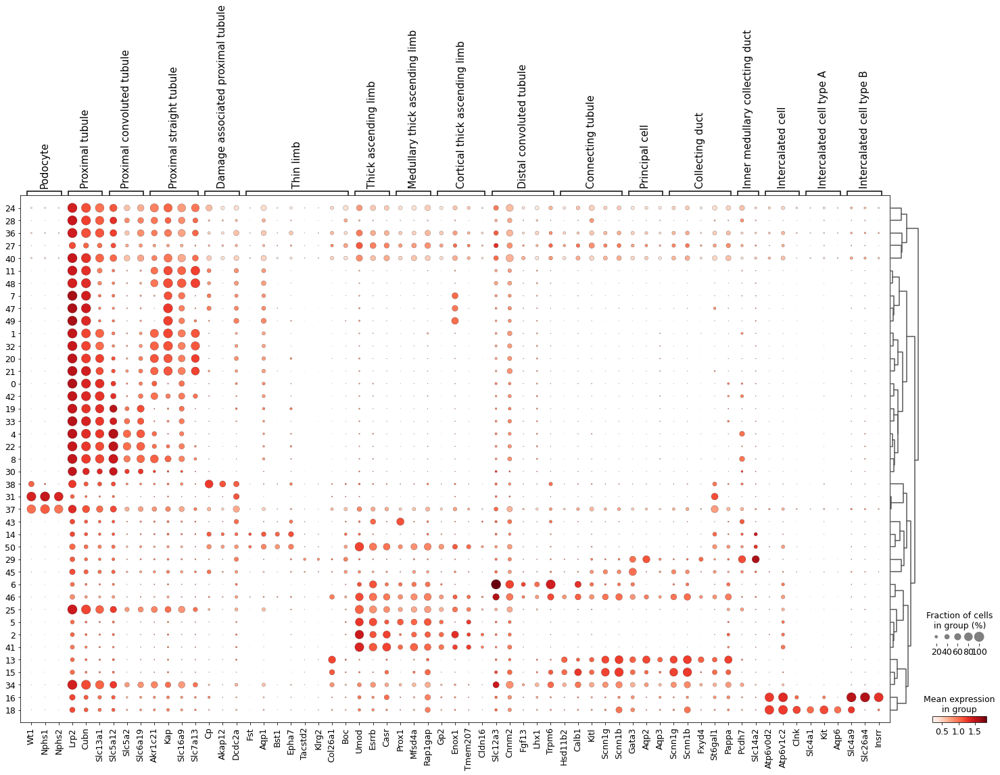

In [41]:
plt.rcParams.update({'font.size': 15})

genes_dict = {
    "Podocyte": ["Wt1","Nphs1", "Nphs2"],
    "Proximal tubule": ["Lrp2","Cubn","Slc13a1"],
    "Proximal convoluted tubule": ["Slc5a12","Slc5a2",
                                   "Slc6a19"],
    "Proximal straight tubule": ["Akr1c21","Kap",
                                 "Slc16a9","Slc7a13"],
    "Damage associated proximal tubule": ["Cp",'Akap12','Dcdc2a'],
    "Thin limb": ["Fst","Aqp1","Bst1","Epha7", "Tacstd2", "Klrg2", "Col26a1", "Boc"],
    "Thick ascending limb": ["Umod","Esrrb","Casr"],
    "Medullary thick ascending limb": ["Prox1", "Mfsd4a","Rap1gap"],
    "Cortical thick ascending limb": ["Gp2", "Enox1", "Tmem207", "Cldn16"],
    "Distal convoluted tubule": ["Slc12a3", "Cnnm2", "Fgf13", "Lhx1", "Trpm6"],
    "Connecting tubule": ["Hsd11b2", "Calb1","Kitl", "Scnn1g", "Scnn1b"],
    "Principal cell": ["Gata3", "Aqp2", "Aqp3"],
    "Collecting duct": ["Scnn1g", "Scnn1b", "Fxyd4", "St6gal1", "Pappa"],
    "Inner medullary collecting duct": ["Pcdh7", "Slc14a2"],  
    "Intercalated cell": ["Atp6v0d2", "Atp6v1c2", "Clnk"],
    "Intercalated cell type A": ["Slc4a1", "Kit", "Aqp6"],
    "Intercalated cell type B": ["Slc4a9", "Slc26a4", "Insrr"],
#     "Endothelial": ['Cd34', 'Pecam1', 'Ptprb', 'Flt1'],
#     "Fibroblast": ["C7","Fbln5",  "Cdh11","Frem1","Dcn"],
#     "Myofibroblast": ["Synpo2", "Lmod1","Col16a1","Gli2","Sulf1","Smoc2"],
#     "VSMC / Pericyte": ["Notch3", "Pdgfrb", "Itga8"],
#     "Mesangial": ["Robo1", "Piezo2", "Daam2"],
#     "Juxtaglomerular" : ["Ren1","Col13a1"],
#     "Smooth muscle": ["Myh11", "Mcam","Rgs5"],
#     "Immune": ["Ptprc","Cd74","Themis","Ikzf1","Bcl11a"],
#     "Adipocyte": ["Adipoq", "Pnpla2"], 
}


sc.pl.dotplot(adata_nephron, genes_dict, 'leiden', mean_only_expressed = True,
              dendrogram=True, log=True)




In [43]:
sc.tl.dendrogram(adata_nonnephron, groupby = 'leiden')

categories: 3, 9, 10, etc.
var_group_labels: Endothelial, Fibroblast, Myofibroblast, etc.


/Users/liz/opt/anaconda3/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


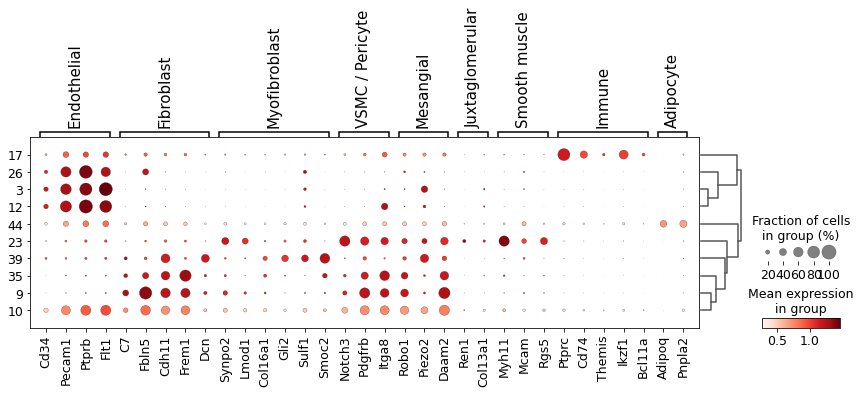

In [44]:
plt.rcParams.update({'font.size': 15})

genes_dict = {
#     "Podocyte": ["Wt1","Nphs1", "Nphs2"],
#     "Proximal tubule": ["Lrp2","Cubn","Slc13a1"],
#     "Proximal convoluted tubule": ["Slc5a12","Slc5a2",
#                                    "Slc6a19"],
#     "Proximal straight tubule": ["Akr1c21","Kap",
#                                  "Slc16a9","Slc7a13"],
#     "Damage associated proximal tubule": ["Cp",'Akap12','Dcdc2a'],
#     "Thin limb": ["Fst","Aqp1","Bst1","Epha7", "Tacstd2", "Klrg2", "Col26a1", "Boc"],
#     "Thick ascending limb": ["Umod","Esrrb","Casr"],
#     "Medullary thick ascending limb": ["Prox1", "Mfsd4a","Rap1gap"],
#     "Cortical thick ascending limb": ["Gp2", "Enox1", "Tmem207", "Cldn16"],
#     "Distal convoluted tubule": ["Slc12a3", "Cnnm2", "Fgf13", "Lhx1", "Trpm6"],
#     "Connecting tubule": ["Hsd11b2", "Calb1","Kitl", "Scnn1g", "Scnn1b"],
#     "Principal cell": ["Gata3", "Aqp2", "Aqp3"],
#     "Collecting duct": ["Scnn1g", "Scnn1b", "Fxyd4", "St6gal1", "Pappa"],
#     "Inner medullary collecting duct": ["Pcdh7", "Slc14a2"],  
#     "Intercalated cell": ["Atp6v0d2", "Atp6v1c2", "Clnk"],
#     "Intercalated cell type A": ["Slc4a1", "Kit", "Aqp6"],
#     "Intercalated cell type B": ["Slc4a9", "Slc26a4", "Insrr"],
    "Endothelial": ['Cd34', 'Pecam1', 'Ptprb', 'Flt1'],
    "Fibroblast": ["C7","Fbln5",  "Cdh11","Frem1","Dcn"],
    "Myofibroblast": ["Synpo2", "Lmod1","Col16a1","Gli2","Sulf1","Smoc2"],
    "VSMC / Pericyte": ["Notch3", "Pdgfrb", "Itga8"],
    "Mesangial": ["Robo1", "Piezo2", "Daam2"],
    "Juxtaglomerular" : ["Ren1","Col13a1"],
    "Smooth muscle": ["Myh11", "Mcam","Rgs5"],
    "Immune": ["Ptprc","Cd74","Themis","Ikzf1","Bcl11a"],
    "Adipocyte": ["Adipoq", "Pnpla2"], 
}


sc.pl.dotplot(adata_nonnephron, genes_dict, 'leiden', mean_only_expressed = True,
              dendrogram=True, log=True)




In [ ]:
sc.tl.dendrogram(adata_doublet, groupby = 'leiden')

/Users/liz/opt/anaconda3/lib/python3.8/site-packages/scanpy/tools/_dendrogram.py:163: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = dat


In [ ]:
genes_dict = {
    "Podocyte": ["Wt1","Nphs1", "Nphs2"],
    "Proximal tubule": ["Lrp2","Cubn","Slc13a1"],
    "Proximal convoluted tubule": ["Slc5a12","Slc5a2",
                                   "Slc6a19"],
    "Proximal straight tubule": ["Akr1c21","Kap",
                                 "Slc16a9","Slc7a13"],
    "Damage associated proximal tubule": ["Cp",'Akap12','Dcdc2a'],
    "Thin limb": ["Fst","Aqp1","Bst1","Epha7", "Tacstd2", "Klrg2", "Col26a1", "Boc"],
    "Thick ascending limb": ["Umod","Esrrb","Casr"],
    "Medullary thick ascending limb": ["Prox1", "Mfsd4a","Rap1gap"],
    "Cortical thick ascending limb": ["Gp2", "Enox1", "Tmem207", "Cldn16"],
    "Distal convoluted tubule": ["Slc12a3", "Cnnm2", "Fgf13", "Lhx1", "Trpm6"],
    "Connecting tubule": ["Hsd11b2", "Calb1","Kitl", "Scnn1g", "Scnn1b"],
    "Principal cell": ["Gata3", "Aqp2", "Aqp3"],
    "Collecting duct": ["Scnn1g", "Scnn1b", "Fxyd4", "St6gal1", "Pappa"],
    "Inner medullary collecting duct": ["Pcdh7", "Slc14a2"],  
    "Intercalated cell": ["Atp6v0d2", "Atp6v1c2", "Clnk"],
    "Intercalated cell type A": ["Slc4a1", "Kit", "Aqp6"],
    "Intercalated cell type B": ["Slc4a9", "Slc26a4", "Insrr"],
    "Endothelial": ['Cd34', 'Pecam1', 'Ptprb', 'Flt1'],
    "Fibroblast": ["C7","Fbln5",  "Cdh11","Frem1","Dcn"],
    "Myofibroblast": ["Synpo2", "Lmod1","Col16a1","Gli2","Sulf1","Smoc2"],
    "VSMC / Pericyte": ["Notch3", "Pdgfrb", "Itga8"],
    "Mesangial": ["Robo1", "Piezo2", "Daam2"],
    "Juxtaglomerular" : ["Ren1","Col13a1"],
    "Smooth muscle": ["Myh11", "Mcam","Rgs5"],
    "Immune": ["Ptprc","Cd74","Themis","Ikzf1","Bcl11a"],
    "Adipocyte": ["Adipoq", "Pnpla2"], 
}

sc.tl.dendrogram(adata_doublet, groupby = 'leiden')


In [ ]:
plt.rcParams.update({'font.size': 15})

sc.pl.dotplot(adata_doublet, genes_dict, 'leiden', mean_only_expressed = True,
              dendrogram=True, log=True)


